In [ ]:

!pip install super-gradients==3.1.3
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

  Using cached pyparsing-2.4.5-py2.py3-none-any.whl (67 kB)
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 2.4.7
    Uninstalling pyparsing-2.4.7:
      Successfully uninstalled pyparsing-2.4.7
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 1.1.2 requires pyparsing==2.4.7, but you have pyparsing 2.4.5 which is incompatible.


  Using cached pyparsing-2.4.7-py2.py3-none-any.whl (67 kB)
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 2.4.5
    Uninstalling pyparsing-2.4.5:
      Successfully uninstalled pyparsing-2.4.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
super-gradients 3.1.3 requires pyparsing==2.4.5, but you have pyparsing 2.4.7 which is incompatible.


In [ ]:
from super_gradients.training import models

yolo_nas_l = models.get("yolo_nas_l", pretrained_weights="coco")

[2023-07-23 14:40:00] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2023-07-23 14:40:06] INFO - utils.py - NumExpr defaulting to 2 threads.
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-07-23 14:40:08] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-07-23 14:40:08] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-07-23 14:40:08] WARNING - export.py - Failed to import pytorch_quantization
[2023-07-23 14:40:08] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-07-23 14:40:09] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [ ]:
!pip install torchinfo
from torchinfo import summary

summary(model=yolo_nas_l,
        input_size=(16, 3, 640, 640),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

[2023-07-23 15:22:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


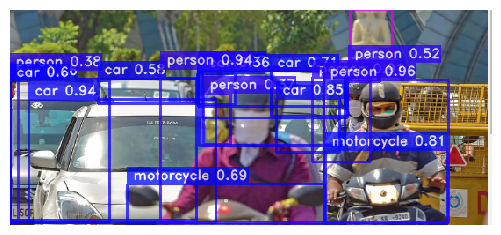

In [ ]:
url = "/content/Screenshot 2023-07-23 205152.png"
yolo_nas_l.predict(url, conf=0.25).show()

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [ ]:
from super_gradients.training import models

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

[2023-07-23 15:26:59] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="eTdwzfkCw6tAlLD4O6E4")
project = rf.workspace("helmet-detection-fjs0a").project("helmet-fix")
dataset = project.version(25).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.134`, to intall it `pip install ultralytics==8.0.134`.


Extracting Dataset Version Zip to helmet-fix-25 in yolov8:: 100%|██████████| 13542/13542 [00:02<00:00, 4569.40it/s]


In [ ]:
LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

location: /content/helmet-fix-25
classes: ['Driver', 'WithHelmet', 'WithoutHelmet']


In [ ]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 8
MAX_EPOCHS = 10
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

Caching annotations: 100%|██████████| 17/17 [00:00<00:00, 5922.68it/s]


In [ ]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': (640, 640), 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': (640, 640), 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5),
 DetectionPaddedRescale('additional_samples_count': 0, 'non_em

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2023-07-23 15:36:36] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}
%reload_ext tensorboard

Reusing TensorBoard on port 6006 (pid 15598), started 0:00:31 ago. (Use '!kill 15598' to kill it.)

<IPython.core.display.Javascript object>

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

The console stream is now moved to /content/checkpoints/helmet-fix/console_Jul23_15_37_28.txt


[2023-07-23 15:37:28] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-07-23 15:37:31] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 6261       (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         782        (len(train_loader))
    - Gradient updates per epoch:   782        (len(train_loader) / batch_accumulate)

[2023-07-23 15:37:31] INFO - sg_trainer.py - Started training for 10 epochs (0/9)

Validating: 100%|██████████| 61/61 [00:24<00:00,  2.51it/s]
[2023-07-23 15:47:10] INFO - base_sg_logger.py -

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5103
│   ├── Ppyoloeloss/loss_iou = 0.2625
│   ├── Ppyoloeloss/loss_dfl = 1.1969
│   └── Ppyoloeloss/loss = 2.7649
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1833
    ├── Ppyoloeloss/loss_iou = 0.1705
    ├── Ppyoloeloss/loss_dfl = 0.8056
    ├── Ppyoloeloss/loss = 2.0122
    ├── Precision@0.50 = 0.035
    ├── Recall@0.50 = 0.6244
    ├── Map@0.50 = 0.4018
    └── F1@0.50 = 0.0663



Validating epoch 1: 100%|██████████| 61/61 [00:23<00:00,  2.55it/s]
[2023-07-23 15:57:01] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/helmet-fix/ckpt_best.pth
[2023-07-23 15:57:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9196233153343201


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8359
│   │   ├── Epoch N-1      = 1.5103 (↘ -0.6744)
│   │   └── Best until now = 1.5103 (↘ -0.6744)
│   ├── Ppyoloeloss/loss_iou = 0.1815
│   │   ├── Epoch N-1      = 0.2625 (↘ -0.081)
│   │   └── Best until now = 0.2625 (↘ -0.081)
│   ├── Ppyoloeloss/loss_dfl = 0.8758
│   │   ├── Epoch N-1      = 1.1969 (↘ -0.3211)
│   │   └── Best until now = 1.1969 (↘ -0.3211)
│   └── Ppyoloeloss/loss = 1.7276
│       ├── Epoch N-1      = 2.7649 (↘ -1.0373)
│       └── Best until now = 2.7649 (↘ -1.0373)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6976
    │   ├── Epoch N-1      = 1.1833 (↘ -0.4857)
    │   └── Best until now = 1.1833 (↘ -0.4857)
    ├── Ppyoloeloss/loss_iou = 0.1291
    │   ├── Epoch N-1      = 0.1705 (↘ -0.0414)
    │   └── Best until now = 0.1705 (↘ -0.0414)
    ├── Ppyoloeloss/loss_dfl = 0.7039
    │   ├── Epoch N-1      = 0.8056 (↘ -0.1016)
    │   └── Best until now = 0.8056 (↘ -0.1016)
    ├── Ppyoloeloss/loss

Validating epoch 2: 100%|██████████| 61/61 [00:23<00:00,  2.58it/s]
[2023-07-23 16:06:48] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/helmet-fix/ckpt_best.pth
[2023-07-23 16:06:48] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9229207634925842


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7953
│   │   ├── Epoch N-1      = 0.8359 (↘ -0.0406)
│   │   └── Best until now = 0.8359 (↘ -0.0406)
│   ├── Ppyoloeloss/loss_iou = 0.1773
│   │   ├── Epoch N-1      = 0.1815 (↘ -0.0042)
│   │   └── Best until now = 0.1815 (↘ -0.0042)
│   ├── Ppyoloeloss/loss_dfl = 0.86
│   │   ├── Epoch N-1      = 0.8758 (↘ -0.0159)
│   │   └── Best until now = 0.8758 (↘ -0.0159)
│   └── Ppyoloeloss/loss = 1.6686
│       ├── Epoch N-1      = 1.7276 (↘ -0.059)
│       └── Best until now = 1.7276 (↘ -0.059)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6863
    │   ├── Epoch N-1      = 0.6976 (↘ -0.0112)
    │   └── Best until now = 0.6976 (↘ -0.0112)
    ├── Ppyoloeloss/loss_iou = 0.1288
    │   ├── Epoch N-1      = 0.1291 (↘ -0.0002)
    │   └── Best until now = 0.1291 (↘ -0.0002)
    ├── Ppyoloeloss/loss_dfl = 0.7114
    │   ├── Epoch N-1      = 0.7039 (↗ 0.0075)
    │   └── Best until now = 0.7039 (↗ 0.0075)
    ├── Ppyoloeloss/loss = 1

Validating epoch 3: 100%|██████████| 61/61 [00:23<00:00,  2.56it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8006
│   │   ├── Epoch N-1      = 0.7953 (↗ 0.0053)
│   │   └── Best until now = 0.7953 (↗ 0.0053)
│   ├── Ppyoloeloss/loss_iou = 0.1773
│   │   ├── Epoch N-1      = 0.1773 (↘ -0.0)
│   │   └── Best until now = 0.1773 (↘ -0.0)
│   ├── Ppyoloeloss/loss_dfl = 0.8647
│   │   ├── Epoch N-1      = 0.86   (↗ 0.0048)
│   │   └── Best until now = 0.86   (↗ 0.0048)
│   └── Ppyoloeloss/loss = 1.6762
│       ├── Epoch N-1      = 1.6686 (↗ 0.0076)
│       └── Best until now = 1.6686 (↗ 0.0076)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7213
    │   ├── Epoch N-1      = 0.6863 (↗ 0.035)
    │   └── Best until now = 0.6863 (↗ 0.035)
    ├── Ppyoloeloss/loss_iou = 0.1318
    │   ├── Epoch N-1      = 0.1288 (↗ 0.003)
    │   └── Best until now = 0.1288 (↗ 0.003)
    ├── Ppyoloeloss/loss_dfl = 0.7136
    │   ├── Epoch N-1      = 0.7114 (↗ 0.0021)
    │   └── Best until now = 0.7039 (↗ 0.0096)
    ├── Ppyoloeloss/loss = 1.4076
    │   ├─

Validating epoch 4: 100%|██████████| 61/61 [00:23<00:00,  2.58it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.765
│   │   ├── Epoch N-1      = 0.8006 (↘ -0.0355)
│   │   └── Best until now = 0.7953 (↘ -0.0303)
│   ├── Ppyoloeloss/loss_iou = 0.169
│   │   ├── Epoch N-1      = 0.1773 (↘ -0.0083)
│   │   └── Best until now = 0.1773 (↘ -0.0083)
│   ├── Ppyoloeloss/loss_dfl = 0.831
│   │   ├── Epoch N-1      = 0.8647 (↘ -0.0338)
│   │   └── Best until now = 0.86   (↘ -0.029)
│   └── Ppyoloeloss/loss = 1.6031
│       ├── Epoch N-1      = 1.6762 (↘ -0.073)
│       └── Best until now = 1.6686 (↘ -0.0654)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7051
    │   ├── Epoch N-1      = 0.7213 (↘ -0.0162)
    │   └── Best until now = 0.6863 (↗ 0.0188)
    ├── Ppyoloeloss/loss_iou = 0.1318
    │   ├── Epoch N-1      = 0.1318 (↘ -0.0)
    │   └── Best until now = 0.1288 (↗ 0.003)
    ├── Ppyoloeloss/loss_dfl = 0.715
    │   ├── Epoch N-1      = 0.7136 (↗ 0.0014)
    │   └── Best until now = 0.7039 (↗ 0.011)
    ├── Ppyoloeloss/loss = 1.392
    

Validating epoch 5: 100%|██████████| 61/61 [00:23<00:00,  2.56it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7477
│   │   ├── Epoch N-1      = 0.765  (↘ -0.0174)
│   │   └── Best until now = 0.765  (↘ -0.0174)
│   ├── Ppyoloeloss/loss_iou = 0.1624
│   │   ├── Epoch N-1      = 0.169  (↘ -0.0067)
│   │   └── Best until now = 0.169  (↘ -0.0067)
│   ├── Ppyoloeloss/loss_dfl = 0.8122
│   │   ├── Epoch N-1      = 0.831  (↘ -0.0187)
│   │   └── Best until now = 0.831  (↘ -0.0187)
│   └── Ppyoloeloss/loss = 1.5598
│       ├── Epoch N-1      = 1.6031 (↘ -0.0434)
│       └── Best until now = 1.6031 (↘ -0.0434)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7194
    │   ├── Epoch N-1      = 0.7051 (↗ 0.0143)
    │   └── Best until now = 0.6863 (↗ 0.0331)
    ├── Ppyoloeloss/loss_iou = 0.1319
    │   ├── Epoch N-1      = 0.1318 (↗ 0.0002)
    │   └── Best until now = 0.1288 (↗ 0.0031)
    ├── Ppyoloeloss/loss_dfl = 0.7161
    │   ├── Epoch N-1      = 0.715  (↗ 0.0011)
    │   └── Best until now = 0.7039 (↗ 0.0121)
    ├── Ppyoloeloss/loss = 1

Validating epoch 6: 100%|██████████| 61/61 [00:24<00:00,  2.53it/s]
[2023-07-23 16:46:06] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/helmet-fix/ckpt_best.pth
[2023-07-23 16:46:06] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9434046149253845


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7295
│   │   ├── Epoch N-1      = 0.7477 (↘ -0.0182)
│   │   └── Best until now = 0.7477 (↘ -0.0182)
│   ├── Ppyoloeloss/loss_iou = 0.1581
│   │   ├── Epoch N-1      = 0.1624 (↘ -0.0043)
│   │   └── Best until now = 0.1624 (↘ -0.0043)
│   ├── Ppyoloeloss/loss_dfl = 0.7992
│   │   ├── Epoch N-1      = 0.8122 (↘ -0.013)
│   │   └── Best until now = 0.8122 (↘ -0.013)
│   └── Ppyoloeloss/loss = 1.5242
│       ├── Epoch N-1      = 1.5598 (↘ -0.0355)
│       └── Best until now = 1.5598 (↘ -0.0355)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6464
    │   ├── Epoch N-1      = 0.7194 (↘ -0.0731)
    │   └── Best until now = 0.6863 (↘ -0.04)
    ├── Ppyoloeloss/loss_iou = 0.1241
    │   ├── Epoch N-1      = 0.1319 (↘ -0.0078)
    │   └── Best until now = 0.1288 (↘ -0.0047)
    ├── Ppyoloeloss/loss_dfl = 0.6962
    │   ├── Epoch N-1      = 0.7161 (↘ -0.0198)
    │   └── Best until now = 0.7039 (↘ -0.0077)
    ├── Ppyoloeloss/loss =

Validating epoch 7: 100%|██████████| 61/61 [00:23<00:00,  2.56it/s]
[2023-07-23 16:56:05] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/helmet-fix/ckpt_best.pth
[2023-07-23 16:56:05] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9494092464447021


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7072
│   │   ├── Epoch N-1      = 0.7295 (↘ -0.0223)
│   │   └── Best until now = 0.7295 (↘ -0.0223)
│   ├── Ppyoloeloss/loss_iou = 0.1508
│   │   ├── Epoch N-1      = 0.1581 (↘ -0.0073)
│   │   └── Best until now = 0.1581 (↘ -0.0073)
│   ├── Ppyoloeloss/loss_dfl = 0.7786
│   │   ├── Epoch N-1      = 0.7992 (↘ -0.0206)
│   │   └── Best until now = 0.7992 (↘ -0.0206)
│   └── Ppyoloeloss/loss = 1.4735
│       ├── Epoch N-1      = 1.5242 (↘ -0.0507)
│       └── Best until now = 1.5242 (↘ -0.0507)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6553
    │   ├── Epoch N-1      = 0.6464 (↗ 0.0089)
    │   └── Best until now = 0.6464 (↗ 0.0089)
    ├── Ppyoloeloss/loss_iou = 0.123
    │   ├── Epoch N-1      = 0.1241 (↘ -0.0011)
    │   └── Best until now = 0.1241 (↘ -0.0011)
    ├── Ppyoloeloss/loss_dfl = 0.6899
    │   ├── Epoch N-1      = 0.6962 (↘ -0.0063)
    │   └── Best until now = 0.6962 (↘ -0.0063)
    ├── Ppyoloeloss/loss 

Validating epoch 8: 100%|██████████| 61/61 [00:24<00:00,  2.52it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.6839
│   │   ├── Epoch N-1      = 0.7072 (↘ -0.0233)
│   │   └── Best until now = 0.7072 (↘ -0.0233)
│   ├── Ppyoloeloss/loss_iou = 0.1447
│   │   ├── Epoch N-1      = 0.1508 (↘ -0.0061)
│   │   └── Best until now = 0.1508 (↘ -0.0061)
│   ├── Ppyoloeloss/loss_dfl = 0.7575
│   │   ├── Epoch N-1      = 0.7786 (↘ -0.021)
│   │   └── Best until now = 0.7786 (↘ -0.021)
│   └── Ppyoloeloss/loss = 1.4243
│       ├── Epoch N-1      = 1.4735 (↘ -0.0492)
│       └── Best until now = 1.4735 (↘ -0.0492)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6722
    │   ├── Epoch N-1      = 0.6553 (↗ 0.0169)
    │   └── Best until now = 0.6464 (↗ 0.0258)
    ├── Ppyoloeloss/loss_iou = 0.1223
    │   ├── Epoch N-1      = 0.123  (↘ -0.0006)
    │   └── Best until now = 0.123  (↘ -0.0006)
    ├── Ppyoloeloss/loss_dfl = 0.683
    │   ├── Epoch N-1      = 0.6899 (↘ -0.0069)
    │   └── Best until now = 0.6899 (↘ -0.0069)
    ├── Ppyoloeloss/loss = 

Validating epoch 9: 100%|██████████| 61/61 [00:23<00:00,  2.54it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.6644
│   │   ├── Epoch N-1      = 0.6839 (↘ -0.0195)
│   │   └── Best until now = 0.6839 (↘ -0.0195)
│   ├── Ppyoloeloss/loss_iou = 0.14
│   │   ├── Epoch N-1      = 0.1447 (↘ -0.0047)
│   │   └── Best until now = 0.1447 (↘ -0.0047)
│   ├── Ppyoloeloss/loss_dfl = 0.744
│   │   ├── Epoch N-1      = 0.7575 (↘ -0.0135)
│   │   └── Best until now = 0.7575 (↘ -0.0135)
│   └── Ppyoloeloss/loss = 1.3864
│       ├── Epoch N-1      = 1.4243 (↘ -0.0379)
│       └── Best until now = 1.4243 (↘ -0.0379)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6148
    │   ├── Epoch N-1      = 0.6722 (↘ -0.0574)
    │   └── Best until now = 0.6464 (↘ -0.0315)
    ├── Ppyoloeloss/loss_iou = 0.1211
    │   ├── Epoch N-1      = 0.1223 (↘ -0.0012)
    │   └── Best until now = 0.1223 (↘ -0.0012)
    ├── Ppyoloeloss/loss_dfl = 0.6813
    │   ├── Epoch N-1      = 0.683  (↘ -0.0017)
    │   └── Best until now = 0.683  (↘ -0.0017)
    ├── Ppyoloeloss/loss 

[2023-07-23 17:16:49] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 61/61 [00:24<00:00,  2.51it/s]


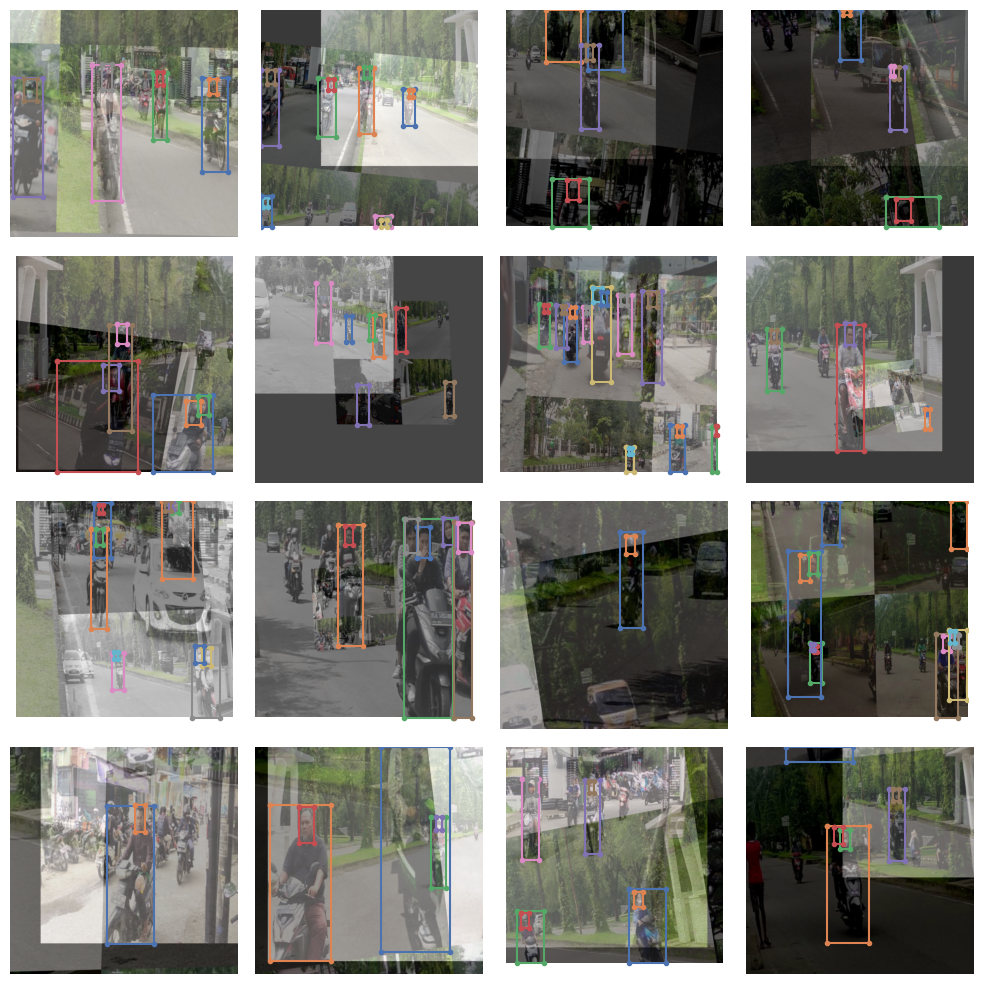

In [ ]:
train_data.dataset.plot()

In [ ]:
!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

  adding: content/checkpoints/helmet-fix/ (stored 0%)
  adding: content/checkpoints/helmet-fix/logs_Jul23_15_31_04.txt (deflated 89%)
  adding: content/checkpoints/helmet-fix/events.out.tfevents.1690126648.dc75027dcada.1274.2 (deflated 81%)
  adding: content/checkpoints/helmet-fix/average_model.pth (deflated 8%)
  adding: content/checkpoints/helmet-fix/experiment_logs_Jul23_15_37_28.txt (deflated 72%)
  adding: content/checkpoints/helmet-fix/events.out.tfevents.1690126570.dc75027dcada.1274.1 (deflated 43%)
  adding: content/checkpoints/helmet-fix/experiment_logs_Jul23_15_31_04.txt (deflated 72%)
  adding: content/checkpoints/helmet-fix/ckpt_latest.pth (deflated 8%)
  adding: content/checkpoints/helmet-fix/console_Jul23_15_37_28.txt (deflated 95%)
  adding: content/checkpoints/helmet-fix/ckpt_best.pth

In [ ]:

import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path=f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/average_model.pth"
).to(DEVICE)

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing:  67%|██████▋   | 2/3 [00:01<00:00,  1.66it/s]

{'PPYoloELoss/loss_cls': 0.7049124,
 'PPYoloELoss/loss_iou': 0.13364594,
 'PPYoloELoss/loss_dfl': 0.7095619,
 'PPYoloELoss/loss': 1.393808,
 'Precision@0.50': 0.1025172770023346,
 'Recall@0.50': 0.9743589758872986,
 'mAP@0.50': 0.9050066471099854,
 'F1@0.50': 0.184507355093956}

Testing: 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]


In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

[2023-07-23 17:22:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-07-23 17:22:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-07-23 17:22:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-07-23 17:22:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-07-23 17:22:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-07-23 17:22:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-07-23 17:22:34] INFO -

In [ ]:
import random
random.seed(10)

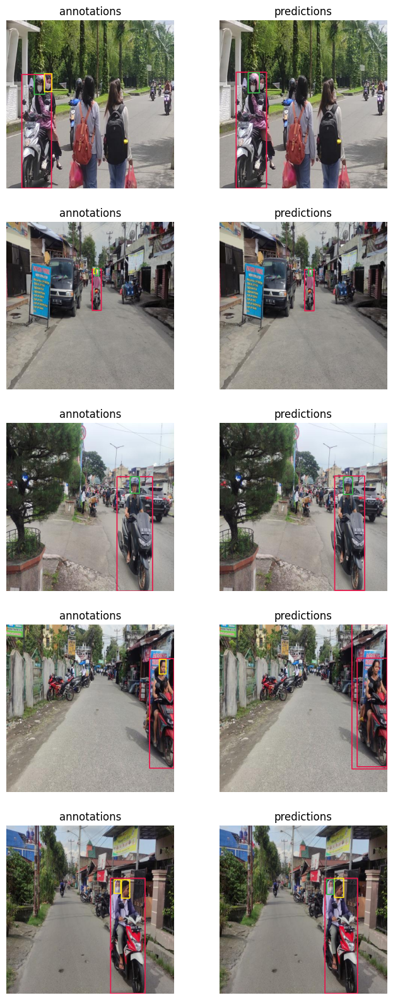

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

In [ ]:
!pip install onemetric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 4.5 MB/s eta 0:00:00


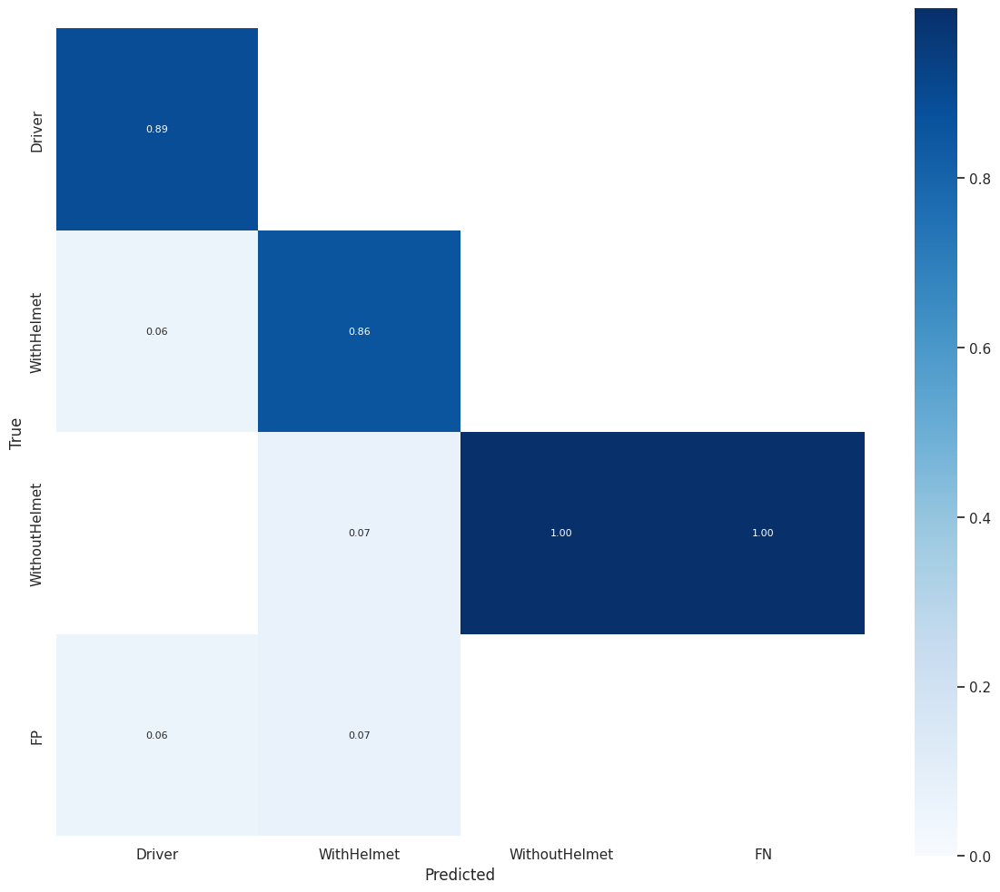

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing:  67%|██████▋   | 2/3 [00:01<00:00,  1.58it/s]

{'PPYoloELoss/loss_cls': 0.7049126,
 'PPYoloELoss/loss_iou': 0.13364595,
 'PPYoloELoss/loss_dfl': 0.70956206,
 'PPYoloELoss/loss': 1.3938084,
 'Precision@0.50': 0.1025172770023346,
 'Recall@0.50': 0.9743589758872986,
 'mAP@0.50': 0.9050066471099854,
 'F1@0.50': 0.184507355093956}

Testing: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
